In [1]:
#Nivel de ruido
n_scans = 3
##inhomogeneidades_var = 'no' #si/no
#BM4D = 'si' #si/no

#Si queremos que quite n slices del principio y fin para evitar imágenes oscuras
#quitar_slices = 4

#Augmentation
#augmentation = 'no' #si/no
#flipleft = "no"
#flipupdown = "no"
#zoom = "no"

SEED = 50
sigma_psd = 0.06

In [2]:
denoise_BM4D = ''
denoise_BM3D = ''
denoise_NLM = 'si'
denoise_bi = ''
original = ''

In [3]:
import scipy.io
import os
#import fastmri
#from fastmri.data import transforms as T
import numpy as np
import numpy
from matplotlib import pyplot as plt
import random

import math

from skimage.metrics import structural_similarity as ssim

from sklearn.model_selection import train_test_split

from random import randint

import matplotlib.patches as patches
from bm4d import bm4d

import cv2 as cv

from datetime import datetime 
import time

import importlib
import utils
importlib.reload(utils)

C:\Users\usuario\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\usuario\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\usuario\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


<module 'utils' from 'C:\\Users\\usuario\\Desktop\\TFM\\TFM_ordenador_FER\\physio_MRI\\physio_code\\AE_Physio\\metodos_clasicos\\utils.py'>

## Load Preprocess

In [4]:
x_train = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_train.npy')
x_train_noisy = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_train_noisy.npy')
x_test = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_test.npy')
x_test_noisy = np.load('../save_images/no_augmentation/n_scans_' + str(n_scans) +'/bm4d_and_no_inhom/x_test_noisy.npy')

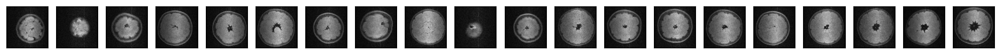

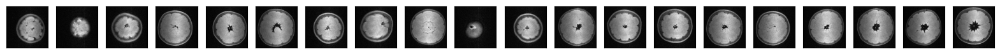

In [5]:
n = 20
z = 20
plt.figure(figsize=(20, 10))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(x_train_noisy[i+z].reshape(x_train_noisy.shape[1], x_train_noisy.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

plt.figure(figsize=(20, 10))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(x_train[i+z].reshape(x_train_noisy.shape[1], x_train_noisy.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

## Predict

In [6]:
from bm4d import bm4d
from bm3d import bm3d
from skimage.restoration import denoise_nl_means
from skimage.restoration import denoise_bilateral
from skimage import img_as_float
from scipy.fft import fftn
from scipy.fft import fft2
from scipy import signal

In [7]:
x_test_noisy.shape

(36, 160, 160, 1)

In [8]:
#(Cuesta un rato ejecutar esta celda)
roi = 20

if denoise_BM4D == 'si':
    print("BM4D")
    #Time
    start_time = datetime.now()
    #decoded_imgs = x_test_noisy.copy()
    decoded_imgs = bm4d(x_test_noisy[:,:,:,0], sigma_psd=sigma_psd)
    decoded_imgs = decoded_imgs.reshape(-1, decoded_imgs.shape[1], decoded_imgs.shape[2],1)
    #Time
    print(" ")
    print('Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))

elif denoise_BM3D == 'si':
    print("BM3D")
    #Time
    start_time = datetime.now()
    #decoded_imgs = x_test_noisy.copy()
    decoded_imgs = bm3d(x_test_noisy[:,:,:,0], sigma_psd=sigma_psd)
    decoded_imgs = decoded_imgs.reshape(-1, decoded_imgs.shape[1], decoded_imgs.shape[2],1)
    #Time
    print(" ")
    print('Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))    
    
elif denoise_NLM == 'si':
    print("NLM")
    #Time
    start_time = datetime.now()
    #decoded_imgs = x_test_noisy.copy()    
    denoise_nl_means
    decoded_imgs = []
    for i in range(x_test_noisy.shape[0]):
        decoded_imgs_i = denoise_nl_means(img_as_float(x_test_noisy[i,:,:,0]))
        decoded_imgs.append(decoded_imgs_i)
    decoded_imgs = np.asarray(decoded_imgs)
    decoded_imgs = decoded_imgs.reshape(-1, decoded_imgs.shape[1], decoded_imgs.shape[2],1)
    #Time
    print(" ")
    print('Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))
    
elif denoise_bi == 'si':
    print("Bilateral")
    #Time
    start_time = datetime.now()
    #decoded_imgs = x_test_noisy.copy()    
    denoise_nl_means
    decoded_imgs = []
    for i in range(x_test_noisy.shape[0]):
        decoded_imgs_i = denoise_bilateral(x_test_noisy[i,:,:,0])
        decoded_imgs.append(decoded_imgs_i)
    decoded_imgs = np.asarray(decoded_imgs)
    decoded_imgs = decoded_imgs.reshape(-1, decoded_imgs.shape[1], decoded_imgs.shape[2],1)
    #Time
    print(" ")
    print('Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))
    
elif original == "si":
    decoded_imgs = x_test_noisy.copy()

NLM
 
Time elapsed (hh:mm:ss.ms) 0:00:05.480999


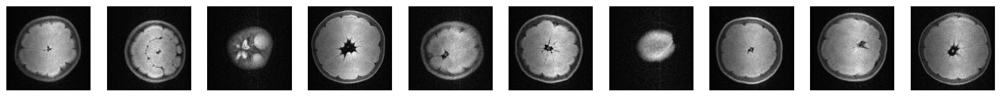

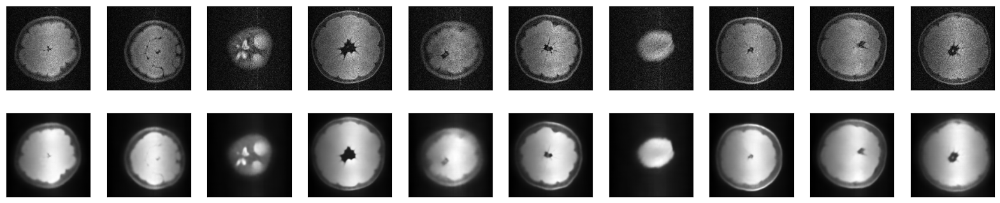

In [9]:
n = 10
plt.figure(figsize=(20, 4))
for i in range(1, n + 1):
    # Display original 
    ax = plt.subplot(2, n, i + n)
    plt.imshow(x_test[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 10
plt.figure(figsize=(20, 4))
for i in range(1, n + 1):
    # Display original noise
    ax = plt.subplot(2, n, i)
    plt.imshow(x_test_noisy[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Display reconstruction
    ax = plt.subplot(2, n, i + n)
    plt.imshow(decoded_imgs[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

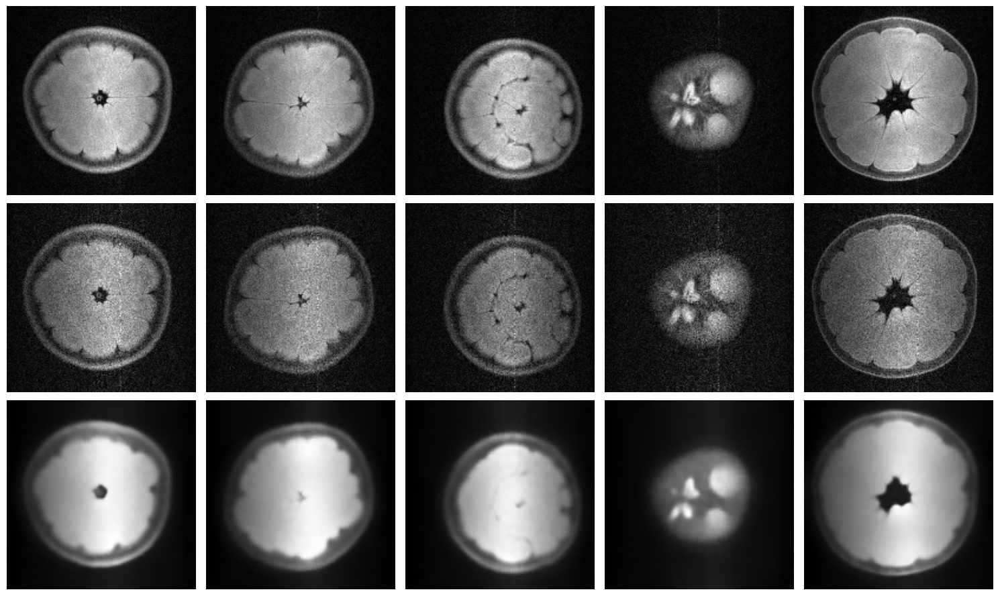

In [10]:
utils.show_image(x_test, x_test_noisy, decoded_imgs)

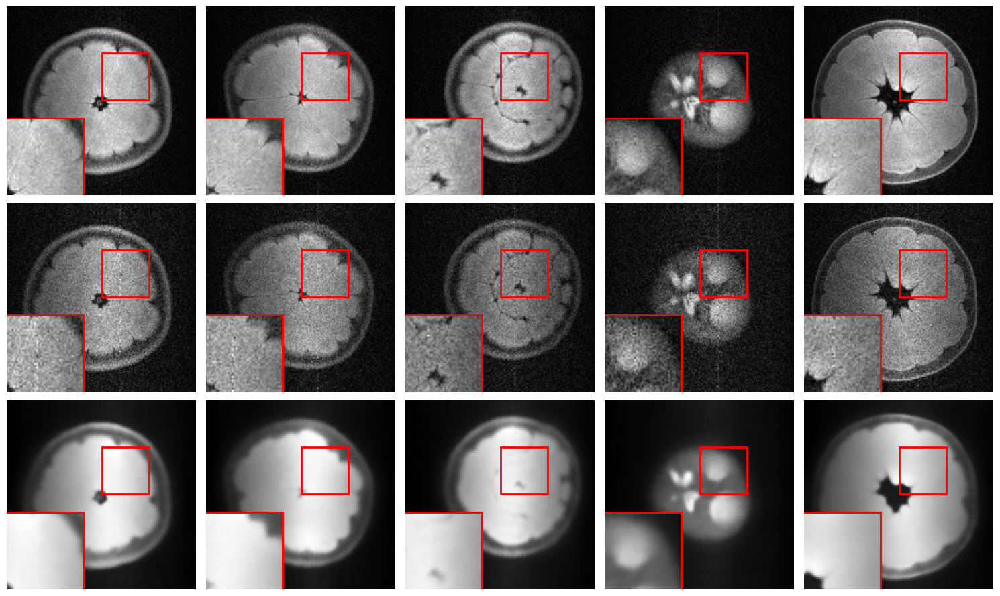

In [11]:
utils.show_windows_image(x_test, x_test_noisy, decoded_imgs)

## Métricas

In [12]:
#PSNR
from skimage.metrics import peak_signal_noise_ratio as psnr
psnr_general=0
psnr_noise_hist=[]
for i in list(range(x_test.shape[0])):
    psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])
    psnr_noise_hist.append(psnr_noise)
    psnr_general=psnr_general+psnr_noise

mean_psnr = psnr_general/x_test.shape[0]

#std PSNR
sum_std = []
for i in list(range(x_test.shape[0])):
    psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])
    psnr_noise_mean = (psnr_noise - mean_psnr)**2
    sum_std.append(psnr_noise_mean)

psnr_std = (np.sum(psnr_noise_mean)/x_test.shape[0])**0.5
print('PSNR: '+ str(mean_psnr) + " +- " + str(psnr_std))


#SSIM
from skimage.metrics import structural_similarity as ssim
ssim_general=0
ssim_noise_hist=[]

#Compute the mean structural similarity index between two images.
for i in list(range(x_test.shape[0])):
    ssim_noise = ssim(x_test[i,:,:,0], decoded_imgs[i,:,:,0],
                  data_range=decoded_imgs[i,:,:,0].max() - decoded_imgs[i,:,:,0].min())
    ssim_noise_hist.append(ssim_noise)
    ssim_general=ssim_general+ssim_noise
    
mean_ssim = ssim_general/x_test.shape[0]

#std SSIM
sum_std = []
for i in list(range(x_test.shape[0])):
    ssim_noise = ssim(x_test[i,:,:,0], decoded_imgs[i,:,:,0],
                  data_range=decoded_imgs[i,:,:,0].max() - decoded_imgs[i,:,:,0].min())
    ssim_noise_mean = (ssim_noise - mean_ssim)**2
    sum_std.append(ssim_noise_mean)
    
ssim_std = (np.sum(ssim_noise_mean)/x_test.shape[0])**0.5
print("SSIM: "+ str(mean_ssim) + " +- " + str(ssim_std))

PSNR: 24.855204105212614 +- 0.014614527351122675
SSIM: 0.44007324722692465 +- 0.005166132617029103


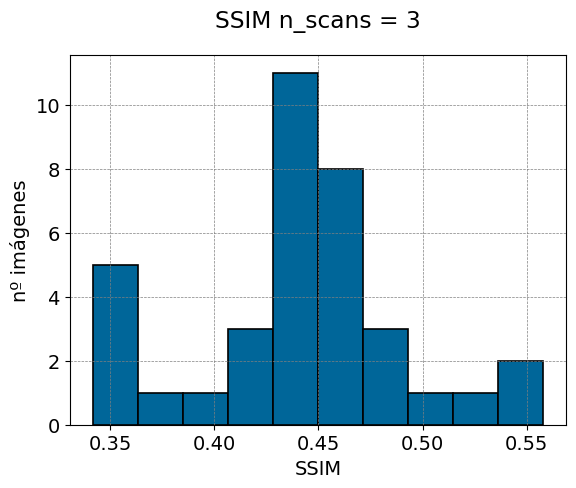

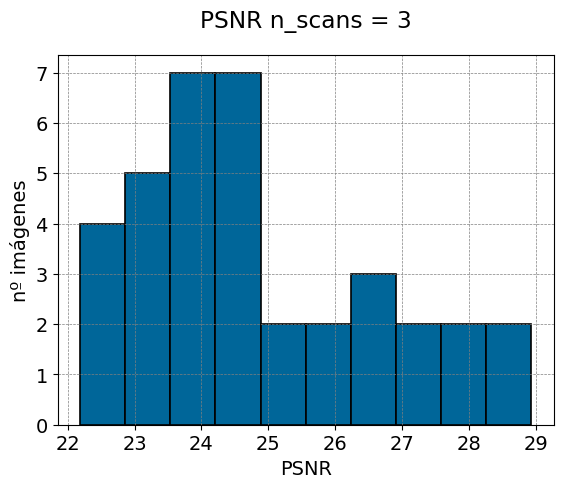

In [13]:
plt.rcParams.update({'font.size': 14})
plt.hist(ssim_noise_hist, color='#006699', edgecolor='black', linewidth=1.2)
plt.xlabel('SSIM')
plt.ylabel('nº imágenes')
plt.title('SSIM n_scans = ' +  str(n_scans), pad = 20)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
plt.gca().set_facecolor('white')
plt.show()

plt.rcParams.update({'font.size': 14})
plt.hist(psnr_noise_hist, color='#006699', edgecolor='black', linewidth=1.2)
plt.xlabel('PSNR')
plt.ylabel('nº imágenes')
plt.title('PSNR n_scans = ' +  str(n_scans), pad = 20)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
plt.gca().set_facecolor('white')
plt.show()

In [14]:
hist_sort_values=np.sort(ssim_noise_hist)
hist_sort_index=np.argsort(ssim_noise_hist)

hist_sort_values_psnr=np.sort(psnr_noise_hist)
hist_sort_index_psnr=np.argsort(psnr_noise_hist)

**worst ssim and psnr**

In [15]:
worst_ssim=hist_sort_index[:5]
worst_psnr=hist_sort_index_psnr[:5]

In [16]:
worst_ssim

array([10, 29, 11, 27,  5], dtype=int64)

In [17]:
print(hist_sort_values[:5])
print(hist_sort_values_psnr[:5])

[0.3415045  0.34327099 0.34401915 0.34700714 0.34708229]
[22.18736681 22.43466823 22.4776977  22.66661388 23.07663009]


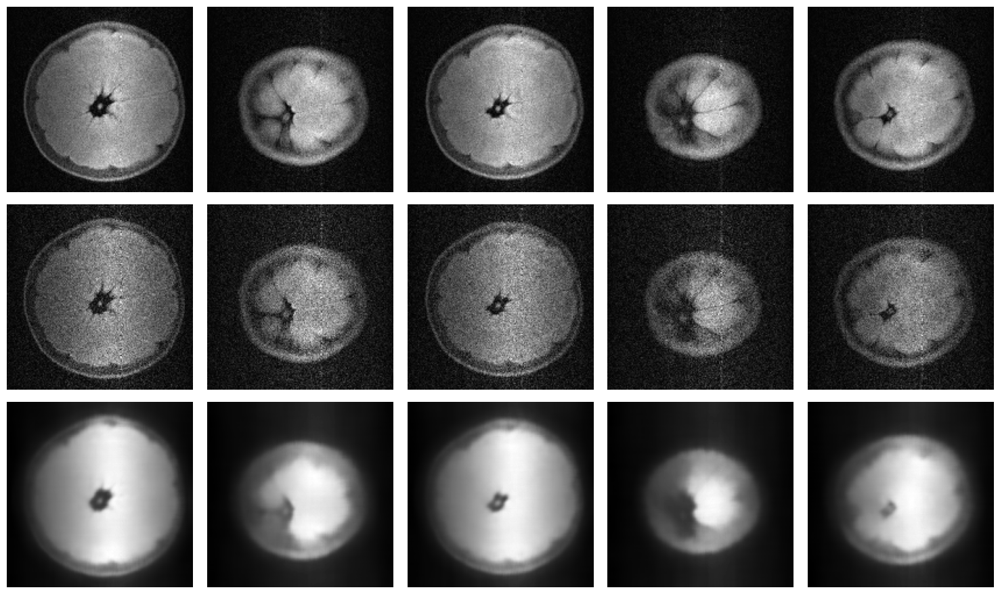

In [18]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_ssim)

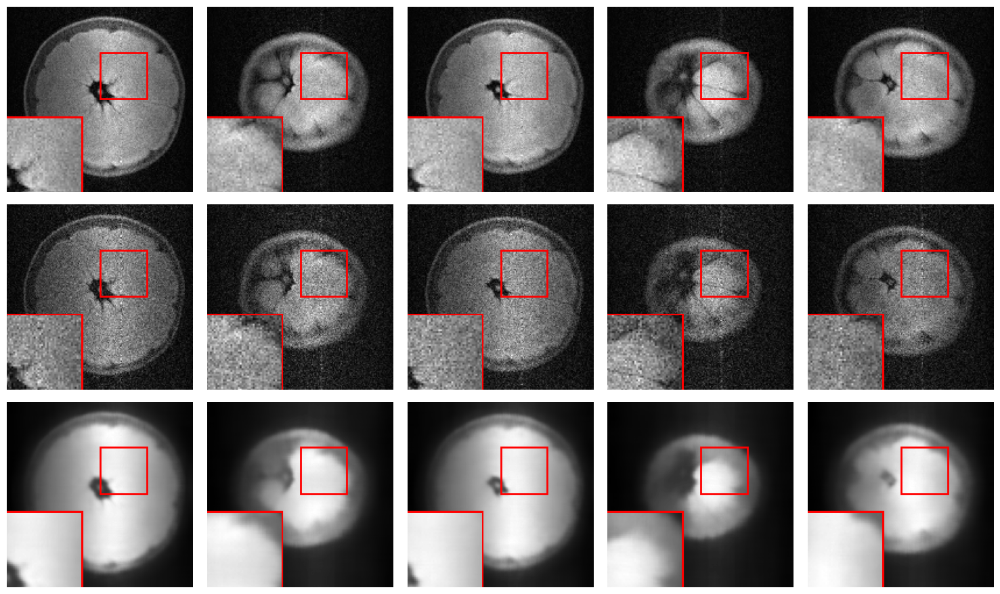

In [19]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_ssim)

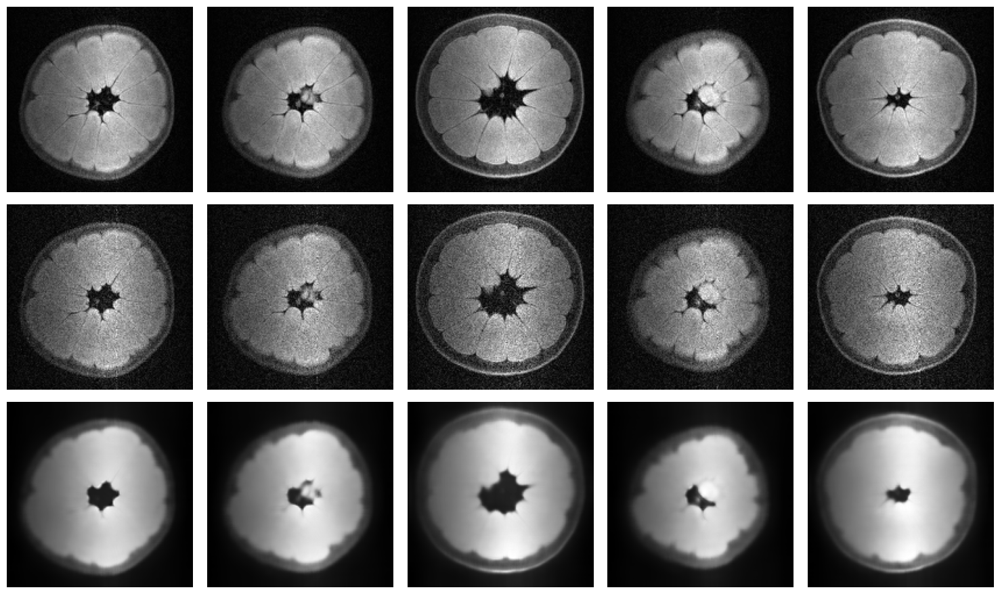

In [20]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_psnr)

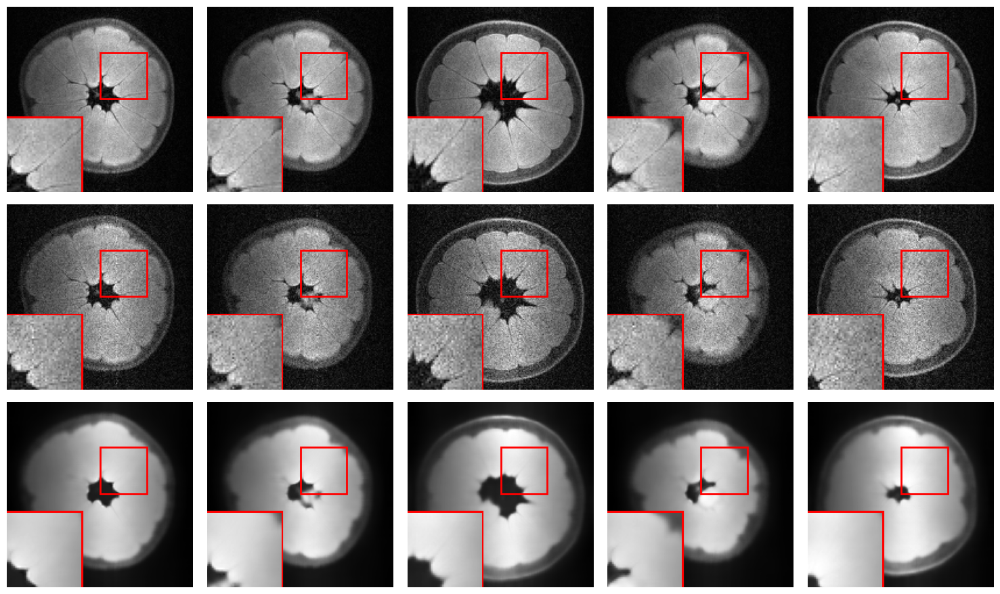

In [21]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_psnr)

**best SSIM**

In [22]:
best_ssim=hist_sort_index[len(hist_sort_index)-5:len(hist_sort_index)]
best_psnr=hist_sort_index_psnr[len(hist_sort_index_psnr)-5:len(hist_sort_index_psnr)]

In [23]:
print(hist_sort_values[len(hist_sort_values)-5:len(hist_sort_values)])
print(hist_sort_values_psnr[len(hist_sort_values_psnr)-5:len(hist_sort_values_psnr)])

[0.48580094 0.49386271 0.53322874 0.53909305 0.5580652 ]
[27.50177913 27.61485171 27.69931384 28.66767411 28.93056344]


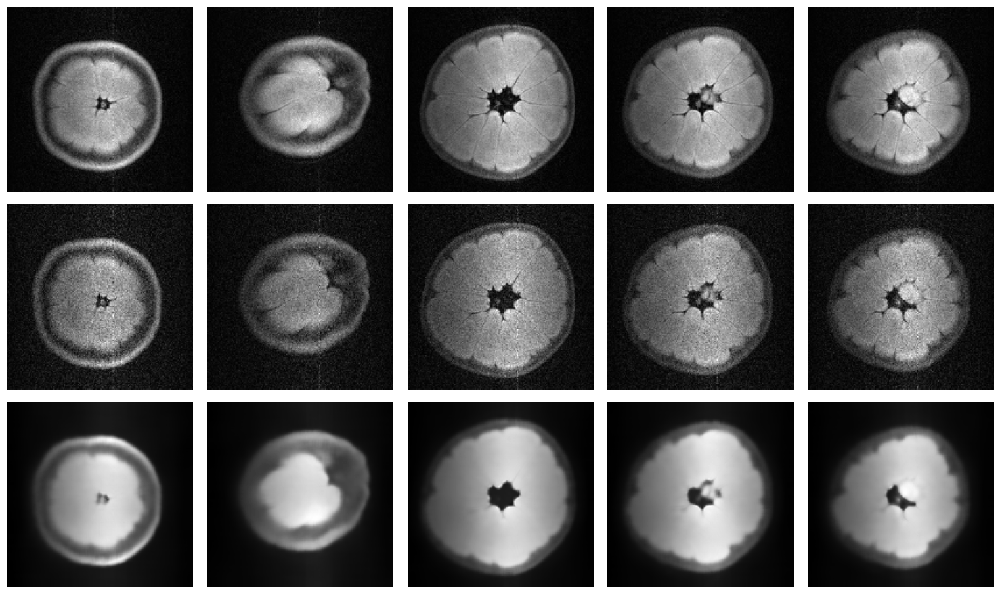

In [24]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_ssim)

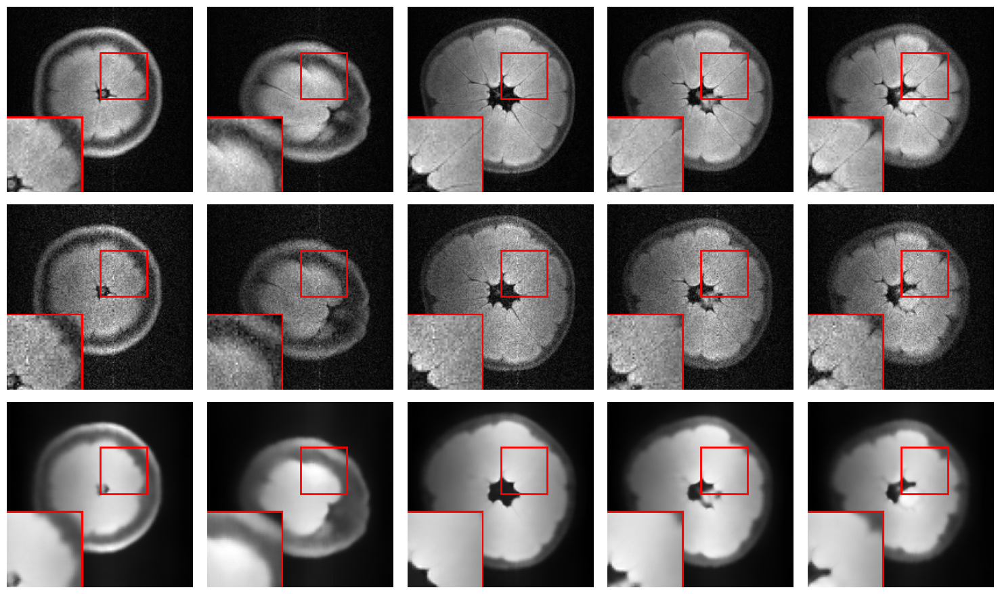

In [25]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_ssim)

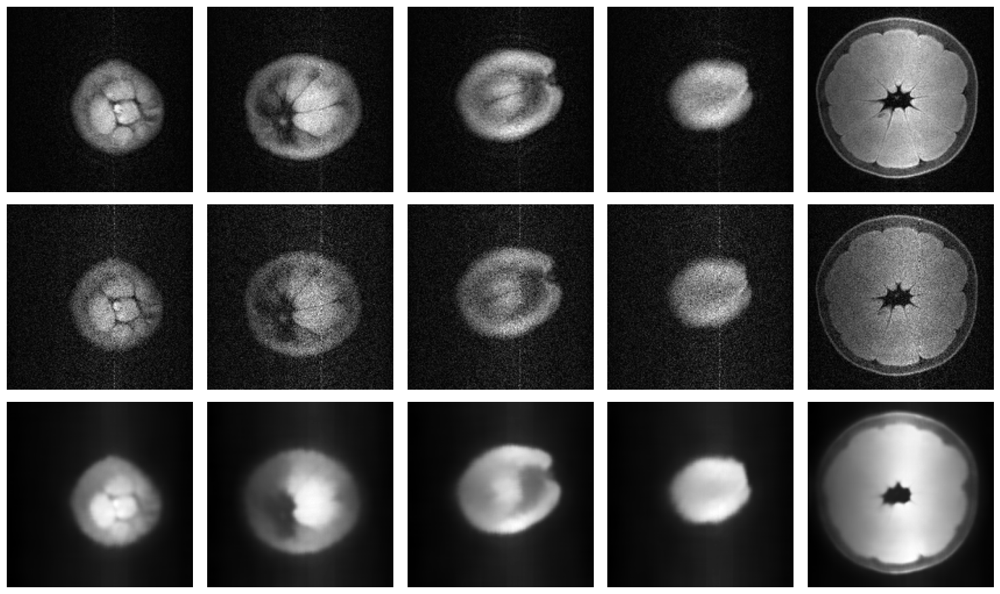

In [26]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_psnr)

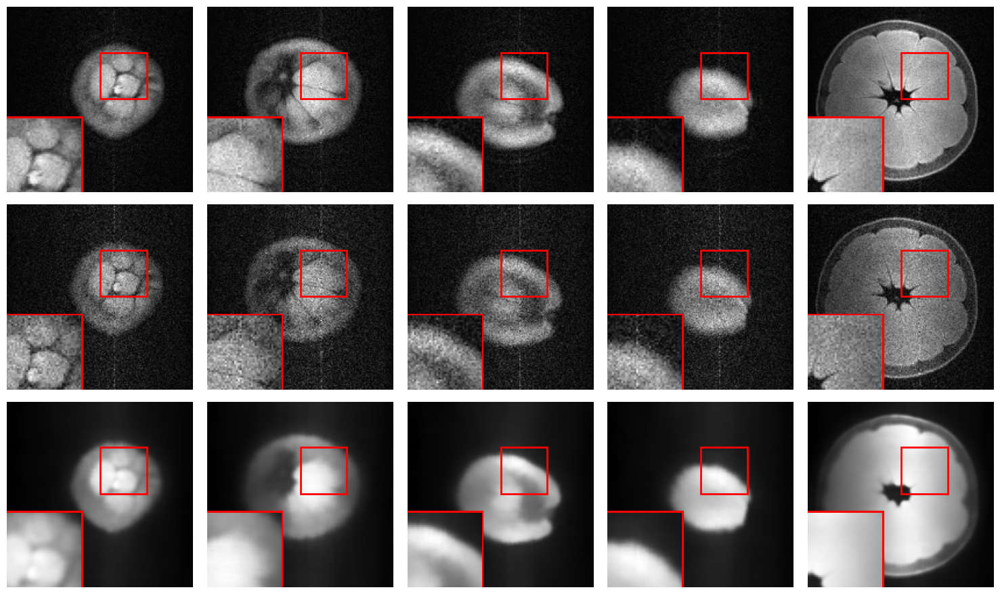

In [27]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_psnr)